In [1]:
import os
import pandas as pd
import numpy as np
import glob
import json
import re
import nibabel 
import nilearn
from nilearn import plotting 
from nilearn.plotting import plot_glass_brain
from nilearn.glm.second_level import SecondLevelModel
from nilearn.masking import intersect_masks
from nilearn.image import math_img
from nilearn.glm import threshold_stats_img
import matplotlib.pyplot as plt

In [2]:
#get 3 group means

In [41]:
def get_group_average_contrast(contrast,ses,group,task,covariates):
    print('Now processing: '+ ' '.join([contrast,ses,group,task]))
    space='MNI152NLin6Asym' 

    effect_size_maps, all_subs = get_effect_size_maps(contrast,ses,group,task)
    
    #ensure we have data
    if not effect_size_maps:
        print('No effect size maps, so cannot generate group level output for: '+' '.join([contrast,ses,group,task]))
        return (None, None, None)
    
    #note that subject formatting is changed slightly to match that of the non_imaging_data csv file
    #need these to make design matrix
    subs_csv = ['_'.join([s for s in re.split(r'(MM|HC)', sub) if s]) for sub in all_subs]
    
    #needed for printing total later
    part_count = len(subs_csv)
    
    #create design matrix including all covariates and a way to encode group average (either as col of 1s or with Male/Female)
    group_design_matrix = create_group_design_matrix(subs_csv,group,ses,covariates)
    display(group_design_matrix)
    
    #grab masks needed
    masks = glob.glob(f'../../../derivatives/ses-{ses}/sub-{sub}*/ses-{ses}/func/sub-{sub}*task-{task}*rec-unco*run-*_*{space}*brain_mask.nii.gz')

    #make intersection of the masks
    #threshold=1 corresponds to keeping the intersection of all masks, whereas threshold=0 is the union of all masks
    mask = intersect_masks(masks, threshold=1, connected=True)


    cache_loc = './nilearn_cache' #change if desired

    #define model specs
    second_level_model = SecondLevelModel(mask_img=mask, target_affine=None, target_shape=None, 
                                          smoothing_fwhm=None, memory=cache_loc, memory_level=1, 
                                          verbose=0, n_jobs=-2, minimize_memory=False)

    #fit model
    second_level_model = second_level_model.fit(effect_size_maps, design_matrix=group_design_matrix,)

    
    #define contrast matrix 
    contrast_matrix = np.eye(group_design_matrix.shape[1])
    contrasts = dict([(column, contrast_matrix[i])
                      for i, column in enumerate(group_design_matrix.columns)])

    #here we do a group average or focus on the cudit slope if part of covariates:
    if 'total_cudit' in covariates:
        grp_contrast = contrasts['total_cudit']
    elif 'THC_freq_month' in covariates:
        grp_contrast = contrasts['THC_freq_month']
    elif 'sex' in covariates:
        grp_contrast = 0.5*contrasts['Female']+0.5*contrasts['Male']
    else:
        grp_contrast = contrasts['group_average']
        
    print(grp_contrast)
    
    #compute the group average contrast
    #pick stat_type none because it automatically selects t vs. F test 
    contrast_output = second_level_model.compute_contrast(second_level_contrast=grp_contrast, 
                                                          second_level_stat_type=None, output_type='all')
    
    #for printing the covariates
    if covariates == '':
        covariates = 'nothing'
        
    print('Processing done for: '+' '.join([contrast,ses,group,task]))
    print(f'Controlled for {covariates}')
    
    return (contrast_output, mask, part_count)



In [42]:
def get_effect_size_maps(contrast,ses,group,task):
    #get individual effect size maps
    #get all second-level contrasts that exist
    second_level_effect_size_maps = glob.glob(f'../../../derivatives/nilearn/second_level/sub-{group}*/ses-{ses}/task-{task}/sub-{group}*_ses-{ses}_task-{task}_rec-unco_contrast-{contrast}_effect_size_fx.nii.gz')
    second_level_subs = [path.split('/sub-')[1].split('/')[0] for path in second_level_effect_size_maps if path]
    
    #get first-level contrasts for the remaining subjects
    all_first_level_effect_size_maps = glob.glob(f'../../../derivatives/nilearn/first_level/sub-{group}*/ses-{ses}/task-{task}/sub-{group}*_ses-{ses}_task-{task}_rec-unco_run-*_contrast-{contrast}_effect_size.nii.gz')
    first_level_effect_size_maps = [path for path in all_first_level_effect_size_maps if path.split('/sub-')[1].split('/')[0] not in second_level_subs]
    first_level_subs = [path.split('/sub-')[1].split('/')[0] for path in first_level_effect_size_maps if path]
    
    #combine the effect_size_maps into one list and the subjects into one list
    effect_size_maps = second_level_effect_size_maps + first_level_effect_size_maps
    
    all_subs = second_level_subs + first_level_subs
    
    return (effect_size_maps, all_subs)


In [43]:
def create_group_design_matrix(subs,group,ses,covariates):
    #TO DO: add mean FD
    
    df_subs = pd.DataFrame(subs,columns=['subs'])
    non_img_data = pd.read_csv(f"../../../sourcedata/non_imaging_data/MMJ-Processed_data-2022_05_27-13_58-6858bbe.csv",low_memory=False)
    dummy_dfs = []
    
    if 'sex' not in covariates:
        #create design matrix with 1 column of 1s and as many rows as there are subjects
        group_design_matrix = pd.DataFrame([1] * len(subs), columns=['group_average'],)
    
    else:
        #create empty design matrix to add to
        group_design_matrix = pd.DataFrame()
        #add columns for male and female, that will then be combined to create the group average 
        grouped_sex = non_img_data.groupby("IDS.CHR.Subject")["SBJ.CHR.Sex"].agg("first")
        dict_sex = grouped_sex.to_dict()
        df_subs['sex'] = df_subs['subs'].map(dict_sex)
        dummy_dfs.append(pd.get_dummies(df_subs['sex']))
    
    #numericals can be added directly
    #mean center numerical values like age and CUDIT!

    if 'age' in covariates:
        #numerical can be added directly
        #mean center numerical value
        grouped_age = non_img_data.groupby("IDS.CHR.Subject")["SBJ.INT.Age"].agg("first")
        dict_age = grouped_age.to_dict()
        group_design_matrix['age'] = df_subs['subs'].map(dict_age)
        group_design_matrix['age'] = group_design_matrix['age'] - group_design_matrix['age'].mean()
    
    if 'total_cudit' in covariates:
        if group == 'HC': 
            grouped_HC_baseline_cudit = non_img_data[non_img_data['SSS.CHR.Time_point'] == 'Screening'].groupby('IDS.CHR.Subject')['INV.INT.CUDIT.Summed_score'].agg("first")
            dict_HC_baseline_cudit = grouped_HC_baseline_cudit.to_dict()
            group_design_matrix['total_cudit'] = df_subs['subs'].map(dict_HC_baseline_cudit)
            group_design_matrix['total_cudit'] = group_design_matrix['total_cudit'] - group_design_matrix['total_cudit'].mean()

        else:
            if ses == 'baseline':
                dict_MM_baseline_cudit = non_img_data[non_img_data['SSS.CHR.Time_point'] == 'Baseline'].groupby('IDS.CHR.Subject')['INV.INT.CUDIT.Summed_score'].agg("first").to_dict()
                group_design_matrix['total_cudit'] = df_subs['subs'].map(dict_MM_baseline_cudit)
                group_design_matrix['total_cudit'] = group_design_matrix['total_cudit'] - group_design_matrix['total_cudit'].mean()
                #needed because MM_141 is nan, so replacing with 0, which is the mean
                group_design_matrix['total_cudit'].fillna(0, inplace=True)
            else:
                dict_MM_1year_cudit = non_img_data[non_img_data['SSS.CHR.Time_point'] == 'One year'].groupby('IDS.CHR.Subject')['INV.INT.CUDIT.Summed_score'].agg("first").to_dict()
                group_design_matrix['total_cudit'] = df_subs['subs'].map(dict_MM_1year_cudit)
                group_design_matrix['total_cudit'] = group_design_matrix['total_cudit'] - group_design_matrix['total_cudit'].mean()
    
    #encode the correspondence 
    freq_dict = {'Once or more per day':7,
        '5-6 days a week':6,
        '3-4 days a week':5,
        '1-2 days a week':4,
        'Less than once a week':3,
        'Less than once every two weeks':2,
        'Less than once a month':1,
        None:0}
    
    if 'THC_freq_month' in covariates:
        if group == 'HC':
            #results from screening visit (using this for consistency since CUDIT-R was also collected at screening visit)
            dict_HC_screening_THC = non_img_data[non_img_data['SSS.CHR.Time_point'] == 'Screening'].groupby('IDS.CHR.Subject')['TLF.CHR.THC.Frequency_in_month'].agg("last").to_dict()
            dict_HC_screening_THC_num = {k:freq_dict[v] for k,v in dict_HC_screening_THC.items()}
            group_design_matrix['THC_freq_month'] = df_subs['subs'].map(dict_HC_screening_THC_num)
            group_design_matrix['THC_freq_month'] = group_design_matrix['THC_freq_month'] - group_design_matrix['THC_freq_month'].mean()
        else:
            if ses == 'baseline':     
                #results from MRI visit (using this for consistency since CUDIT-R was also collected at MRI visit)
                dict_MM_MRIvisit_THC = non_img_data[non_img_data['SSS.CHR.Time_point'] == 'Baseline'].groupby('IDS.CHR.Subject')['TLF.CHR.THC.Frequency_in_month'].agg("first").to_dict()
                dict_MM_MRIvisit_THC_num = {k:freq_dict[v] for k,v in dict_MM_MRIvisit_THC.items()}
                group_design_matrix['THC_freq_month'] = df_subs['subs'].map(dict_MM_MRIvisit_THC_num)
                group_design_matrix['THC_freq_month'] = group_design_matrix['THC_freq_month'] - group_design_matrix['THC_freq_month'].mean()
            else:
                dict_MM_MRIvisit_THC = non_img_data[non_img_data['SSS.CHR.Time_point'] == 'One year'].groupby('IDS.CHR.Subject')['TLF.CHR.THC.Frequency_in_month'].agg("first").to_dict()
                dict_MM_MRIvisit_THC_num = {k:freq_dict[v] for k,v in dict_MM_MRIvisit_THC.items()}
                group_design_matrix['THC_freq_month'] = df_subs['subs'].map(dict_MM_MRIvisit_THC_num)
                group_design_matrix['THC_freq_month'] = group_design_matrix['THC_freq_month'] - group_design_matrix['THC_freq_month'].mean()

                
    #add all items to design matrix that are still missing
    group_design_matrix = pd.concat([group_design_matrix]+dummy_dfs,axis=1,copy=False)
    
    return group_design_matrix



In [44]:
def fdr_threshold_map(z_map,mask):
    threshold_map, threshold = threshold_stats_img(z_map, mask_img=mask, alpha=.05, height_control='fdr', cluster_threshold=0, two_sided=True)
    return (threshold_map, threshold)

    

In [45]:
def plot_axial_slices(threshold_map, threshold, MNI_template_used, contrast, group, ses, part_count):
    
    display = plotting.plot_stat_map(threshold_map, bg_img = MNI_template_used, display_mode='z', cut_coords=[-28,0,28,40,60],
                       threshold=threshold)
    
    if threshold:
        rounded_thresh = round(threshold,2)
        display.title(text=f'Thresholded z map; "{contrast}" contrast of {group} at {ses}, exp. fdr = .05, z_thresh = {rounded_thresh}, n = {part_count}', size=14, y=1.2)
    else:
        display.title(text=f'Effect size map; "{contrast}" contrast of {group} at {ses}, n = {part_count}', size=14, y=1.2)
    return display


In [46]:
def plot_glass_brains(threshold_map, threshold, contrast, group, ses, part_count):
    display = plot_glass_brain(
    stat_map_img = threshold_map,
    threshold=threshold,
    colorbar=True,
    display_mode='ortho',
    plot_abs=False)
    rounded_thresh = round(threshold,2)
    display.title(text=f'Z scores on glass brain; "{contrast}" contrast of {group} at {ses}, exp. fdr = .05, z_thresh = {rounded_thresh}, n = {part_count}',
                  size=14, y=1.2)
    return display

Now processing: HiLoss+LoLoss-AvoidHiLoss-AvoidLoLoss baseline MM mid


,age,total_cudit,Female,Male
0,18.383333,-0.389831,1,0
1,11.383333,-3.389831,1,0
2,14.383333,-0.389831,1,0
3,21.383333,-3.389831,0,1
4,0.383333,-3.389831,1,0
5,8.383333,-1.389831,1,0
6,-14.616667,1.610169,1,0
7,26.383333,0.610169,0,1
8,17.383333,0.000000,1,0
9,25.383333,-3.389831,0,1


[0. 1. 0. 0.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-0.384711, ...,  0.02094 ],
       ...,
       [ 1.294648, ...,  2.52738 ]]), 
array([[18.383333, ...,  0.      ],
       ...,
       [-5.616667, ...,  1.      ]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.9s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6cb551dc0>}, array([0., 1., 0., 0.]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.70s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.5s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.74485 , ...,  1.665054]), <nibabel.nifti1.Nifti1Image object at 0x2ba6ca9e4100>)
___________________________________________________________unmask - 0.2s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.750053, ...,  1.693575]), <nibabel.nifti1.Nifti1Image object at 0x2ba6ca9e4100>)
___________________________________________________________unmask - 0.2s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.771819, ..., 0.047951]), <nibabel.nifti1.Nifti1Image object at 0x2ba6ca9e4100>)
___________________________________________________________unmask - 0.2s, 0.0min
____________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 3.80500178083419. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


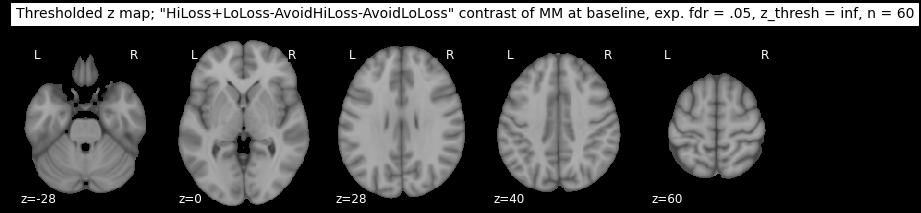

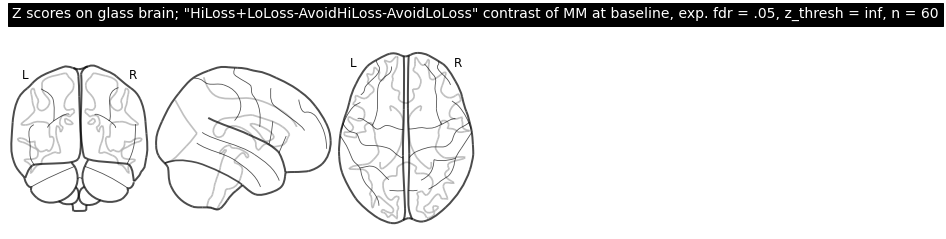

In [47]:
task='mid'
sessions = ['baseline']
groups = ['MM']
MNI_template_used = nibabel.load('./templates/tpl-MNI152NLin6Asym_res-01_desc-brain_T1w.nii.gz')


#combined high/low options include: '
# 'HiRewCue+LoRewCue-NeuCue'(combined reward anticipation)
# 'HiLossCue+LoLossCue-NeuCue' (combined loss anticipation)
# 'HiWin+LoWin-NeuHit' (combined reward outcome cp. to neutral hit)
# 'HiWin+LoWin-HiNoWin-LoNoWin' (combined reward outcome cp. to combined reward miss)
# 'HiLoss+LoLoss-NeuMiss' (combined loss cp. to neutral miss)
# 'HiLoss+LoLoss-AvoidHiLoss-AvoidLoLoss' (combined loss cp. to combined avoid loss)
contrasts=['HiLoss+LoLoss-AvoidHiLoss-AvoidLoLoss']


#options are age, sex, total_cudit, THC_freq_month at the moment
#note that if total_cudit or THC_freq_month are selected, the zmap is for their slopes, not for the group average slope
covariates = ['sex','total_cudit','age']


#TO DO: make this into script
#loop through all sessions, groups, contrasts
for ses in sessions:
    for group in groups:
        #TO DO: get contrasts from the data as opposed to hard coding it in
        #contrasts = 
        
        for contrast in contrasts:
            #get group average group level contrast as the output
            contrast_output, mask, part_count = get_group_average_contrast(contrast,ses,group,task,covariates)
            
            #account for HC not having 1year scans
            if contrast_output:
                #compute FDR-corrected z-score thresholdmap
                #note that this does not have a cluster threshold
                #this image is masked by the mask intersection across all subjects
                threshold_map, threshold = fdr_threshold_map(contrast_output['z_score'], mask)

                #make desired plots
                #mask_axial_slices = plot_axial_slices(mask, None, MNI_template_used, contrast, group, ses, part_count)
                
                #effect_axial_slices = plot_axial_slices(contrast_output['effect_size'], None, MNI_template_used, contrast, group, ses, part_count)
               
                zmap_axial_slices = plot_axial_slices(threshold_map, threshold, MNI_template_used, contrast, group, ses, part_count)
                
                zmap_glass_brain = plot_glass_brains(threshold_map, threshold, contrast, group, ses, part_count)
            

In [ ]:
#group difference model for control vs. MM at baseline 

In [50]:
def get_baseline_group_difference_contrast(contrast,ses,groups,task,covariates):
    
    #get individual effect size maps and a design matrix per group
    effect_size_maps=[] #list of both groups effect size maps
    group_sizes=[] #list of the two group sizes
    group_design_matrices=[] #get separate design matrices per group that will be combined
    for group in groups:
        effect_size_maps_by_group, all_subs = get_effect_size_maps(contrast,ses,group,task)
        effect_size_maps += effect_size_maps_by_group
        group_sizes.append(len(effect_size_maps_by_group))
        
        #note that subject formatting is changed slightly to match that of the non_imaging_data csv file
        #need these to make design matrix
        subs = ['_'.join([s for s in re.split(r'(MM|HC)', sub) if s]) for sub in all_subs]
        
        #create design matrix per group
        #note that the columns that need to stay separate when stacking the design matrices later get renamed
        indv_design_matrix = create_group_design_matrix(subs,group,ses,covariates)
        if 'sex' in covariates:
            indv_design_matrix.rename({'Female': f'Female_{group}', 'Male': f'Male_{group}'}, axis='columns',inplace=True)
        else:
            indv_design_matrix.rename({'group_average': f'group_average_{group}'}, axis='columns',inplace=True)
        group_design_matrices.append(indv_design_matrix)
    
    
    #stack design matrices of the two groups to make one large design matrix
    #note again that group_average or Male&Female columns, which were renamed, will not get stacked
    #thus, these will partially contain NaNs, which will be replaced by 0s
    group_design_matrix = pd.concat(group_design_matrices).replace(np. nan,0) 

    
    #grab masks needed (both groups at baseline)
    masks = glob.glob(f'../../../derivatives/ses-{ses}/sub-*/ses-{ses}/func/sub-*task-{task}*rec-unco*run-*_*{space}*brain_mask.nii.gz')

    #make intersection of the masks
    #threshold=1 corresponds to keeping the intersection of all masks, whereas threshold=0 is the union of all masks
    mask = intersect_masks(masks, threshold=1, connected=True)
    
    
    #define group level model
    cache_loc = './nilearn_cache' #change if desired

    second_level_model = SecondLevelModel(mask_img=mask, target_affine=None, target_shape=None, 
                                      smoothing_fwhm=None, memory=cache_loc, memory_level=1, 
                                      verbose=0, n_jobs=-2, minimize_memory=False)
    #fit model
    second_level_model = second_level_model.fit(
        effect_size_maps,
        design_matrix=group_design_matrix,
    )

    #make list of possible contrasts: HC only, MM only, MM-HC
    contrast_matrix = np.eye(group_design_matrix.shape[1])
    contrasts = dict([(column, contrast_matrix[i])
                  for i, column in enumerate(group_design_matrix.columns)])
    
    
    #here we do a group average difference either just using a column of ones for each group or include the Male/Female columns
    if 'sex' in covariates:
        grp_contrast = 0.5*contrasts['Female_MM']+0.5*contrasts['Male_MM']-0.5*contrasts['Female_HC']-0.5*contrasts['Male_HC']
    else:
        grp_contrast = contrasts['group_average_MM']-contrasts['group_average_HC']
    
    print(grp_contrast)
    
    
    contrast_output = second_level_model.compute_contrast(second_level_contrast=grp_contrast, 
                                                          second_level_stat_type=None, output_type='all')
    
    #for printing the covariates
    if covariates == '':
        covariates = 'nothing'
        
    print('Processing done of the baseline difference of MM and HC for: '+' '.join([contrast,task]))
    print(f'Controlled for {covariates}')

    
    return (contrast_output, mask,(group_sizes[0],group_sizes[1]))



[ 1. -1.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 1.050365, ..., -0.133423],
       ...,
       [-7.878611, ...,  5.106622]]), 
array([[1., 0.],
       ...,
       [0., 1.]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6cbe1edf0>}, array([ 1., -1.]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.80s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.50969 , ..., 1.837339]), <nibabel.nifti1.Nifti1Image object at 0x2ba6cbe1e430>)
___________________________________________________________unmask - 0.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.511459, ..., 1.859693]), <nibabel.nifti1.Nifti1Image object at 0x2ba6cbe1e430>)
___________________________________________________________unmask - 0.2s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.305134, ..., 0.03308 ]), <nibabel.nifti1.Nifti1Image object at 0x2ba6cbe1e430>)
___________________________________________________________unmask - 0.3s, 0.0min
________________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.86938629059742. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


[]


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 1. -1.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 1.270547, ...,  0.762973],
       ...,
       [-9.588925, ...,  1.165017]]), 
array([[1., 0.],
       ...,
       [0., 1.]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d3749bb0>}, array([ 1., -1.]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.74s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.231298, ...,  2.08272 ]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d04a3a90>)
___________________________________________________________unmask - 0.2s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.231968, ...,  2.113702]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d04a3a90>)
___________________________________________________________unmask - 0.2s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.591458, ..., 0.018638]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d04a3a90>)
___________________________________________________________unmask - 0.2s, 0.0min
____________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.727173990101383. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


[]


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 1. -1.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ -6.740094, ...,  -0.403   ],
       ...,
       [-11.430916, ...,  22.776867]]), 
array([[1., 0.],
       ...,
       [0., 1.]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d33598b0>}, array([ 1., -1.]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.69s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.473661, ..., -1.840254]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d3359fd0>)
___________________________________________________________unmask - 0.2s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.475276, ..., -1.862951]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d3359fd0>)
___________________________________________________________unmask - 0.2s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.682129, ..., 0.967135]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d3359fd0>)
___________________________________________________________unmask - 0.4s, 0.0min
____________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.664307794130543. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


[]


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 1. -1.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-4.197979, ..., -3.096594],
       ...,
       [-6.095139, ..., -2.724095]]), 
array([[1., 0.],
       ...,
       [0., 1.]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6caa14d00>}, array([ 1., -1.]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.70s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 0.293321, ..., -0.335112]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d2833130>)
___________________________________________________________unmask - 0.2s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 0.294207, ..., -0.336149]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d2833130>)
___________________________________________________________unmask - 0.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.384639, ..., 0.63123 ]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d2833130>)
___________________________________________________________unmask - 0.3s, 0.0min
____________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.230253427559565. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


[]


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 1. -1.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 3.112181, ..., -3.790761],
       ...,
       [-2.065502, ...,  4.357548]]), 
array([[1., 0.],
       ...,
       [0., 1.]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d1bdad60>}, array([ 1., -1.]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.74s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.980942, ..., 0.085031]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d1bda040>)
___________________________________________________________unmask - 0.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.986318, ..., 0.085269]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d1bda040>)
___________________________________________________________unmask - 0.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.163311, ..., 0.466119]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d1bda040>)
___________________________________________________________unmask - 0.3s, 0.0min
________________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.132741216425018. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


[]


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 1. -1.]
Processing done of the baseline difference of MM and HC for: HiLoss+LoLoss-AvoidHiLoss-AvoidLoLoss mid
Controlled for []


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.425552114063759. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


[]


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 0.5  0.5 -0.5 -0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 1.050365, ..., -0.133423],
       ...,
       [-7.878611, ...,  5.106622]]), 
array([[1., ..., 0.],
       ...,
       [0., ..., 0.]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d1593220>}, array([ 0.5,  0.5, -0.5, -0.5]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.71s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.466017, ...,  2.025749]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d15936a0>)
___________________________________________________________unmask - 0.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.467615, ...,  2.055202]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d15936a0>)
___________________________________________________________unmask - 0.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.679398, ..., 0.021395]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d15936a0>)
___________________________________________________________unmask - 0.3s, 0.0min
____________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.608155655834695. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 0.5  0.5 -0.5 -0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 1.270547, ...,  0.762973],
       ...,
       [-9.588925, ...,  1.165017]]), 
array([[1., ..., 0.],
       ...,
       [0., ..., 0.]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d1db7d60>}, array([ 0.5,  0.5, -0.5, -0.5]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.71s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.602402, ...,  2.305105]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d1db7ca0>)
___________________________________________________________unmask - 0.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.604716, ...,  2.346689]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d1db7ca0>)
___________________________________________________________unmask - 0.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.726547, ..., 0.01058 ]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d1db7ca0>)
___________________________________________________________unmask - 0.3s, 0.0min
____________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.7524899820922295. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 0.5  0.5 -0.5 -0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ -6.740094, ...,  -0.403   ],
       ...,
       [-11.430916, ...,  22.776867]]), 
array([[1., ..., 0.],
       ...,
       [0., ..., 1.]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.5s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d2f1e880>}, array([ 0.5,  0.5, -0.5, -0.5]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.90s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.212974, ..., -1.585602]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d2f1e790>)
___________________________________________________________unmask - 0.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.213607, ..., -1.601592]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d2f1e790>)
___________________________________________________________unmask - 0.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.584326, ..., 0.943585]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d2f1e790>)
___________________________________________________________unmask - 0.3s, 0.0min
____________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.882200250644278. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 0.5  0.5 -0.5 -0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-4.197979, ..., -3.096594],
       ...,
       [-6.095139, ..., -2.724095]]), 
array([[1., ..., 0.],
       ...,
       [0., ..., 0.]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.5s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d57bc0d0>}, array([ 0.5,  0.5, -0.5, -0.5]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.72s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.435468, ...,  0.01475 ]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d57bc670>)
___________________________________________________________unmask - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.436944, ...,  0.014792]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d57bc670>)
___________________________________________________________unmask - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.668389, ..., 0.494116]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d57bc670>)
___________________________________________________________unmask - 0.4s, 0.0min
____________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.009400234513864. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 0.5  0.5 -0.5 -0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 3.112181, ..., -3.790761],
       ...,
       [-2.065502, ...,  4.357548]]), 
array([[1., ..., 0.],
       ...,
       [0., ..., 0.]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.5s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d44802e0>}, array([ 0.5,  0.5, -0.5, -0.5]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.70s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.676384, ..., 0.028633]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d4480a90>)
___________________________________________________________unmask - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.679195, ..., 0.028714]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d4480a90>)
___________________________________________________________unmask - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.249399, ..., 0.488579]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d4480a90>)
___________________________________________________________unmask - 0.4s, 0.0min
________________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.4437479180922494. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:144: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  figure = plt.figure(figure, figsize=figsize,
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 0.5  0.5 -0.5 -0.5]
Processing done of the baseline difference of MM and HC for: HiLoss+LoLoss-AvoidHiLoss-AvoidLoLoss mid
Controlled for ['sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.11350468622629. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 1.  0. -1.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 1.050365, ..., -0.133423],
       ...,
       [-7.878611, ...,  5.106622]]), 
array([[1., ..., 0.],
       ...,
       [0., ..., 1.]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d52cabb0>}, array([ 1.,  0., -1.]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.70s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.510013, ..., 1.831522]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d5b38730>)
___________________________________________________________unmask - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.511803, ..., 1.853944]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d5b38730>)
___________________________________________________________unmask - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.305021, ..., 0.033511]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d5b38730>)
___________________________________________________________unmask - 0.4s, 0.0min
________________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.8528568188089745. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['age']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 1.  0. -1.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 1.270547, ...,  0.762973],
       ...,
       [-9.588925, ...,  1.165017]]), 
array([[1., ..., 0.],
       ...,
       [0., ..., 1.]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d6069d60>}, array([ 1.,  0., -1.]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.70s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.230262, ...,  2.0749  ]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d643f070>)
___________________________________________________________unmask - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.230937, ...,  2.105921]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d643f070>)
___________________________________________________________unmask - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.591056, ..., 0.018998]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d643f070>)
___________________________________________________________unmask - 0.7s, 0.0min
____________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.7022927748611565. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['age']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 1.  0. -1.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ -6.740094, ...,  -0.403   ],
       ...,
       [-11.430916, ...,  22.776867]]), 
array([[1., ..., 0.],
       ...,
       [0., ..., 1.]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d9e12a30>}, array([ 1.,  0., -1.]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.72s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.474932, ..., -1.83003 ]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d9e12760>)
___________________________________________________________unmask - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.476571, ..., -1.85266 ]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d9e12760>)
___________________________________________________________unmask - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.682582, ..., 0.966377]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d9e12760>)
___________________________________________________________unmask - 0.4s, 0.0min
____________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.694699502845164. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['age']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 1.  0. -1.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-4.197979, ..., -3.096594],
       ...,
       [-6.095139, ..., -2.724095]]), 
array([[1., ..., 0.],
       ...,
       [0., ..., 1.]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d75ca1f0>}, array([ 1.,  0., -1.]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.70s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 0.29338 , ..., -0.336813]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d75ca8b0>)
___________________________________________________________unmask - 0.5s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 0.294276, ..., -0.337868]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d75ca8b0>)
___________________________________________________________unmask - 0.5s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.384616, ..., 0.631871]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d75ca8b0>)
___________________________________________________________unmask - 0.4s, 0.0min
____________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.209442937882992. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['age']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 1.  0. -1.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 3.112181, ..., -3.790761],
       ...,
       [-2.065502, ...,  4.357548]]), 
array([[1., ..., 0.],
       ...,
       [0., ..., 1.]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d7b25340>}, array([ 1.,  0., -1.]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.70s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.97548 , ..., 0.084905]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d7b259a0>)
___________________________________________________________unmask - 0.5s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.980857, ..., 0.085146]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d7b259a0>)
___________________________________________________________unmask - 0.5s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.164661, ..., 0.466168]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d7b259a0>)
___________________________________________________________unmask - 0.5s, 0.0min
________________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.136917285514374. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['age']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 1.  0. -1.]
Processing done of the baseline difference of MM and HC for: HiLoss+LoLoss-AvoidHiLoss-AvoidLoLoss mid
Controlled for ['age']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.425154984344862. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['age']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 1.  0. -1.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 1.050365, ..., -0.133423],
       ...,
       [-7.878611, ...,  5.106622]]), 
array([[1., ..., 0.],
       ...,
       [0., ..., 1.]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d8d53ac0>}, array([ 1.,  0., -1.]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.70s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.512805, ..., 1.82845 ]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d8d53f40>)
___________________________________________________________unmask - 0.5s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.514609, ..., 1.850776]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d8d53f40>)
___________________________________________________________unmask - 0.5s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.304044, ..., 0.033741]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d8d53f40>)
___________________________________________________________unmask - 0.5s, 0.0min
________________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.865008096753388. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['THC_freq_month']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 1.  0. -1.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 1.270547, ...,  0.762973],
       ...,
       [-9.588925, ...,  1.165017]]), 
array([[1., ..., 0.],
       ...,
       [0., ..., 1.]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d970f430>}, array([ 1.,  0., -1.]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.66s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.6s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.231937, ...,  2.072668]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d970f520>)
___________________________________________________________unmask - 0.5s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.232617, ...,  2.103601]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d970f520>)
___________________________________________________________unmask - 0.5s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.591706, ..., 0.019102]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d970f520>)
___________________________________________________________unmask - 0.5s, 0.0min
____________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.704909378635479. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['THC_freq_month']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 1.  0. -1.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ -6.740094, ...,  -0.403   ],
       ...,
       [-11.430916, ...,  22.776867]]), 
array([[1., ..., 0.],
       ...,
       [0., ..., 1.]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d9c0d160>}, array([ 1.,  0., -1.]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.73s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.475867, ..., -1.830021]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d9c0ddf0>)
___________________________________________________________unmask - 0.5s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.477511, ..., -1.852651]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d9c0ddf0>)
___________________________________________________________unmask - 0.5s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.682915, ..., 0.966377]), <nibabel.nifti1.Nifti1Image object at 0x2ba6d9c0ddf0>)
___________________________________________________________unmask - 0.5s, 0.0min
____________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.665418854311388. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['THC_freq_month']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 1.  0. -1.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-4.197979, ..., -3.096594],
       ...,
       [-6.095139, ..., -2.724095]]), 
array([[1., ..., 0.],
       ...,
       [0., ..., 1.]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6dc4e28e0>}, array([ 1.,  0., -1.]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.74s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 0.292288, ..., -0.333418]), <nibabel.nifti1.Nifti1Image object at 0x2ba6dc4e2a30>)
___________________________________________________________unmask - 0.5s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 0.293181, ..., -0.334461]), <nibabel.nifti1.Nifti1Image object at 0x2ba6dc4e2a30>)
___________________________________________________________unmask - 0.5s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.385033, ..., 0.630591]), <nibabel.nifti1.Nifti1Image object at 0x2ba6dc4e2a30>)
___________________________________________________________unmask - 0.5s, 0.0min
____________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.212069894950111. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['THC_freq_month']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 1.  0. -1.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 3.112181, ..., -3.790761],
       ...,
       [-2.065502, ...,  4.357548]]), 
array([[1., ..., 0.],
       ...,
       [0., ..., 1.]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6db057f40>}, array([ 1.,  0., -1.]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.73s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.975614, ..., 0.086383]), <nibabel.nifti1.Nifti1Image object at 0x2ba6db5a0100>)
___________________________________________________________unmask - 0.6s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.980993, ..., 0.086628]), <nibabel.nifti1.Nifti1Image object at 0x2ba6db5a0100>)
___________________________________________________________unmask - 0.6s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.164628, ..., 0.465581]), <nibabel.nifti1.Nifti1Image object at 0x2ba6db5a0100>)
___________________________________________________________unmask - 0.6s, 0.0min
________________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.121152862426506. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['THC_freq_month']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 1.  0. -1.]
Processing done of the baseline difference of MM and HC for: HiLoss+LoLoss-AvoidHiLoss-AvoidLoLoss mid
Controlled for ['THC_freq_month']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.514945111875524. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['THC_freq_month']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 1.  0. -1.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 1.050365, ..., -0.133423],
       ...,
       [-7.878611, ...,  5.106622]]), 
array([[1., ..., 0.],
       ...,
       [0., ..., 1.]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6dc3f8df0>}, array([ 1.,  0., -1.]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.70s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.520761, ..., 1.833553]), <nibabel.nifti1.Nifti1Image object at 0x2ba6dc3f8190>)
___________________________________________________________unmask - 0.6s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.522605, ..., 1.856038]), <nibabel.nifti1.Nifti1Image object at 0x2ba6dc3f8190>)
___________________________________________________________unmask - 0.6s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.301266, ..., 0.03336 ]), <nibabel.nifti1.Nifti1Image object at 0x2ba6dc3f8190>)
___________________________________________________________unmask - 0.6s, 0.0min
________________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.844732245376211. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['total_cudit']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 1.  0. -1.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 1.270547, ...,  0.762973],
       ...,
       [-9.588925, ...,  1.165017]]), 
array([[1., ..., 0.],
       ...,
       [0., ..., 1.]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6dcdc0d30>}, array([ 1.,  0., -1.]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.72s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.231587, ...,  2.071203]), <nibabel.nifti1.Nifti1Image object at 0x2ba6dcdc0490>)
___________________________________________________________unmask - 0.6s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.232266, ...,  2.102078]), <nibabel.nifti1.Nifti1Image object at 0x2ba6dcdc0490>)
___________________________________________________________unmask - 0.6s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.591571, ..., 0.01917 ]), <nibabel.nifti1.Nifti1Image object at 0x2ba6dcdc0490>)
___________________________________________________________unmask - 0.6s, 0.0min
____________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.723406267589152. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['total_cudit']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 1.  0. -1.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ -6.740094, ...,  -0.403   ],
       ...,
       [-11.430916, ...,  22.776867]]), 
array([[1., ..., 0.],
       ...,
       [0., ..., 1.]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6ddb064c0>}, array([ 1.,  0., -1.]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.70s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.475676, ..., -1.830935]), <nibabel.nifti1.Nifti1Image object at 0x2ba6ddb06880>)
___________________________________________________________unmask - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.477319, ..., -1.853594]), <nibabel.nifti1.Nifti1Image object at 0x2ba6ddb06880>)
___________________________________________________________unmask - 0.9s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.682847, ..., 0.966445]), <nibabel.nifti1.Nifti1Image object at 0x2ba6ddb06880>)
___________________________________________________________unmask - 1.1s, 0.0min
____________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.639860190615936. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['total_cudit']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 1.  0. -1.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-4.197979, ..., -3.096594],
       ...,
       [-6.095139, ..., -2.724095]]), 
array([[1., ..., 0.],
       ...,
       [0., ..., 1.]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6de063a60>}, array([ 1.,  0., -1.]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.70s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 0.291683, ..., -0.33339 ]), <nibabel.nifti1.Nifti1Image object at 0x2ba6dfbef970>)
___________________________________________________________unmask - 0.6s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 0.292573, ..., -0.334432]), <nibabel.nifti1.Nifti1Image object at 0x2ba6dfbef970>)
___________________________________________________________unmask - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.385265, ..., 0.63058 ]), <nibabel.nifti1.Nifti1Image object at 0x2ba6dfbef970>)
___________________________________________________________unmask - 0.6s, 0.0min
____________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.208090948279107. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['total_cudit']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 1.  0. -1.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 3.112181, ..., -3.790761],
       ...,
       [-2.065502, ...,  4.357548]]), 
array([[1., ..., 0.],
       ...,
       [0., ..., 1.]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6dec82790>}, array([ 1.,  0., -1.]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.70s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.97803 , ..., 0.086519]), <nibabel.nifti1.Nifti1Image object at 0x2ba6dec82100>)
___________________________________________________________unmask - 0.6s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.983434, ..., 0.086764]), <nibabel.nifti1.Nifti1Image object at 0x2ba6dec82100>)
___________________________________________________________unmask - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.16403 , ..., 0.465527]), <nibabel.nifti1.Nifti1Image object at 0x2ba6dec82100>)
___________________________________________________________unmask - 0.7s, 0.0min
________________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.129218780617506. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['total_cudit']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 1.  0. -1.]
Processing done of the baseline difference of MM and HC for: HiLoss+LoLoss-AvoidHiLoss-AvoidLoLoss mid
Controlled for ['total_cudit']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.493471480618955. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['total_cudit']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 0.   0.5  0.5 -0.5 -0.5]
Processing done of the baseline difference of MM and HC for: HiRewCue+LoRewCue-NeuCue mid
Controlled for ['age', 'sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.608143217507192. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['age', 'sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 0.   0.5  0.5 -0.5 -0.5]
Processing done of the baseline difference of MM and HC for: HiLossCue+LoLossCue-NeuCue mid
Controlled for ['age', 'sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.753201934280677. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['age', 'sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 0.   0.5  0.5 -0.5 -0.5]
Processing done of the baseline difference of MM and HC for: HiWin+LoWin-NeuHit mid
Controlled for ['age', 'sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.855515608933645. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['age', 'sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 0.   0.5  0.5 -0.5 -0.5]
Processing done of the baseline difference of MM and HC for: HiWin+LoWin-HiNoWin-LoNoWin mid
Controlled for ['age', 'sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.062391473960207. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['age', 'sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 0.   0.5  0.5 -0.5 -0.5]
Processing done of the baseline difference of MM and HC for: HiLoss+LoLoss-NeuMiss mid
Controlled for ['age', 'sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.409606992306275. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['age', 'sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 0.   0.5  0.5 -0.5 -0.5]
Processing done of the baseline difference of MM and HC for: HiLoss+LoLoss-AvoidHiLoss-AvoidLoLoss mid
Controlled for ['age', 'sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.13753612531245. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['age', 'sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 0.   0.   0.5  0.5 -0.5 -0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 1.050365, ..., -0.133423],
       ...,
       [-7.878611, ...,  5.106622]]), 
array([[18.327869, ...,  0.      ],
       ...,
       [11.21875 , ...,  0.      ]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6e3101a30>}, array([ 0. ,  0. ,  0.5,  0.5, -0.5, -0.5]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.71s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.436612, ...,  2.033351]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e35924f0>)
___________________________________________________________unmask - 0.8s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.438109, ...,  2.06379 ]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e35924f0>)
___________________________________________________________unmask - 0.8s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.668804, ..., 0.021009]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e35924f0>)
___________________________________________________________unmask - 0.8s, 0.0min
____________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.608232425858126. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['THC_freq_month', 'age', 'sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 0.   0.   0.5  0.5 -0.5 -0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 1.270547, ...,  0.762973],
       ...,
       [-9.588925, ...,  1.165017]]), 
array([[18.327869, ...,  0.      ],
       ...,
       [11.21875 , ...,  0.      ]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6e3b10a90>}, array([ 0. ,  0. ,  0.5,  0.5, -0.5, -0.5]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.74s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.584032, ...,  2.312844]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e3e996a0>)
___________________________________________________________unmask - 0.8s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.58629 , ...,  2.355789]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e3e996a0>)
___________________________________________________________unmask - 0.8s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.720401, ..., 0.010366]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e3e996a0>)
___________________________________________________________unmask - 0.8s, 0.0min
____________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.726873639589837. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['THC_freq_month', 'age', 'sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 0.   0.   0.5  0.5 -0.5 -0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ -6.740094, ...,  -0.403   ],
       ...,
       [-11.430916, ...,  22.776867]]), 
array([[ 18.383333, ...,   0.      ],
       ...,
       [-11.78125 , ...,   1.      ]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6e47e0a00>}, array([ 0. ,  0. ,  0.5,  0.5, -0.5, -0.5]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.70s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.238031, ..., -1.570885]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e47e0df0>)
___________________________________________________________unmask - 0.8s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.238764, ..., -1.586883]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e47e0df0>)
___________________________________________________________unmask - 0.8s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.594072, ..., 0.941895]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e47e0df0>)
___________________________________________________________unmask - 1.0s, 0.0min
____________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 5.007231664012786. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['THC_freq_month', 'age', 'sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 0.   0.   0.5  0.5 -0.5 -0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-4.197979, ..., -3.096594],
       ...,
       [-6.095139, ..., -2.724095]]), 
array([[18.383333, ...,  0.      ],
       ...,
       [11.21875 , ...,  0.      ]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.5s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6e68a2bb0>}, array([ 0. ,  0. ,  0.5,  0.5, -0.5, -0.5]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.71s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.472308, ..., -0.026405]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e68a24c0>)
___________________________________________________________unmask - 0.8s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.473992, ..., -0.026481]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e68a24c0>)
___________________________________________________________unmask - 0.8s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.681647, ..., 0.510533]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e68a24c0>)
___________________________________________________________unmask - 0.8s, 0.0min
____________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.070816397095492. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['THC_freq_month', 'age', 'sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 0.   0.   0.5  0.5 -0.5 -0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 3.112181, ..., -3.790761],
       ...,
       [-2.065502, ...,  4.357548]]), 
array([[18.327869, ...,  0.      ],
       ...,
       [10.967742, ...,  0.      ]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6e5932940>}, array([ 0. ,  0. ,  0.5,  0.5, -0.5, -0.5]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.70s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.663077, ..., 0.061553]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e59327f0>)
___________________________________________________________unmask - 0.8s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.665862, ..., 0.061732]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e59327f0>)
___________________________________________________________unmask - 0.8s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.253641, ..., 0.47546 ]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e59327f0>)
___________________________________________________________unmask - 1.2s, 0.0min
________________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.4104238808260945. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['THC_freq_month', 'age', 'sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 0.   0.   0.5  0.5 -0.5 -0.5]
Processing done of the baseline difference of MM and HC for: HiLoss+LoLoss-AvoidHiLoss-AvoidLoLoss mid
Controlled for ['THC_freq_month', 'age', 'sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.241838771390519. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['THC_freq_month', 'age', 'sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 0.   0.   0.5  0.5 -0.5 -0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 1.050365, ..., -0.133423],
       ...,
       [-7.878611, ...,  5.106622]]), 
array([[18.327869, ...,  0.      ],
       ...,
       [11.21875 , ...,  0.      ]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6e6ba5580>}, array([ 0. ,  0. ,  0.5,  0.5, -0.5, -0.5]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.71s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.471869, ...,  2.029747]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e6ba5d60>)
___________________________________________________________unmask - 0.9s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.473532, ...,  2.060044]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e6ba5d60>)
___________________________________________________________unmask - 0.9s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.68149 , ..., 0.021191]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e6ba5d60>)
___________________________________________________________unmask - 1.1s, 0.0min
____________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.592821049970867. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['total_cudit', 'age', 'sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 0.   0.   0.5  0.5 -0.5 -0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 1.270547, ...,  0.762973],
       ...,
       [-9.588925, ...,  1.165017]]), 
array([[18.327869, ...,  0.      ],
       ...,
       [11.21875 , ...,  0.      ]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6e74e2340>}, array([ 0. ,  0. ,  0.5,  0.5, -0.5, -0.5]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.74s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.598077, ...,  2.316228]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e74e2850>)
___________________________________________________________unmask - 0.9s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.600418, ...,  2.359344]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e74e2850>)
___________________________________________________________unmask - 0.9s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.725106, ..., 0.010273]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e74e2850>)
___________________________________________________________unmask - 0.9s, 0.0min
____________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.736183482065546. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['total_cudit', 'age', 'sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 0.   0.   0.5  0.5 -0.5 -0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ -6.740094, ...,  -0.403   ],
       ...,
       [-11.430916, ...,  22.776867]]), 
array([[ 18.383333, ...,   0.      ],
       ...,
       [-11.78125 , ...,   1.      ]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6e96752b0>}, array([ 0. ,  0. ,  0.5,  0.5, -0.5, -0.5]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.70s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.234425, ..., -1.576828]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e9675370>)
___________________________________________________________unmask - 0.9s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.235146, ..., -1.592974]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e9675370>)
___________________________________________________________unmask - 0.9s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.592673, ..., 0.942582]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e9675370>)
___________________________________________________________unmask - 1.2s, 0.0min
____________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.87021449334252. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['total_cudit', 'age', 'sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 0.   0.   0.5  0.5 -0.5 -0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-4.197979, ..., -3.096594],
       ...,
       [-6.095139, ..., -2.724095]]), 
array([[18.383333, ...,  0.      ],
       ...,
       [11.21875 , ...,  0.      ]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6e8709b80>}, array([ 0. ,  0. ,  0.5,  0.5, -0.5, -0.5]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.70s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.482698, ..., -0.042278]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e8709e50>)
___________________________________________________________unmask - 1.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.484433, ..., -0.042401]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e8709e50>)
___________________________________________________________unmask - 0.9s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.685345, ..., 0.516861]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e8709e50>)
___________________________________________________________unmask - 0.9s, 0.0min
____________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.050139820059013. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['total_cudit', 'age', 'sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 0.   0.   0.5  0.5 -0.5 -0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 3.112181, ..., -3.790761],
       ...,
       [-2.065502, ...,  4.357548]]), 
array([[18.327869, ...,  0.      ],
       ...,
       [10.967742, ...,  0.      ]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6e9076700>}, array([ 0. ,  0. ,  0.5,  0.5, -0.5, -0.5]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.70s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.671703, ..., 0.036421]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e90762e0>)
___________________________________________________________unmask - 0.9s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.674548, ..., 0.036527]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e90762e0>)
___________________________________________________________unmask - 0.9s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.250886, ..., 0.485473]), <nibabel.nifti1.Nifti1Image object at 0x2ba6e90762e0>)
___________________________________________________________unmask - 1.1s, 0.0min
________________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.399044201443852. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['total_cudit', 'age', 'sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


[ 0.   0.   0.5  0.5 -0.5 -0.5]
Processing done of the baseline difference of MM and HC for: HiLoss+LoLoss-AvoidHiLoss-AvoidLoLoss mid
Controlled for ['total_cudit', 'age', 'sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.181151449916706. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


['total_cudit', 'age', 'sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


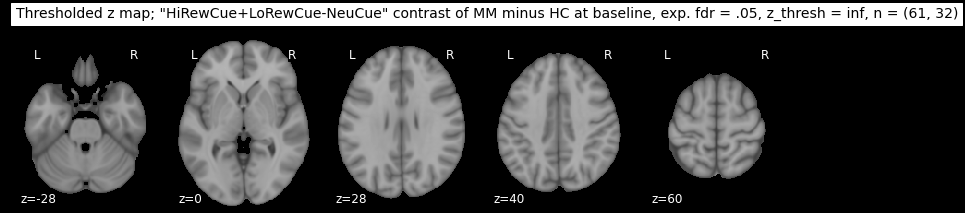

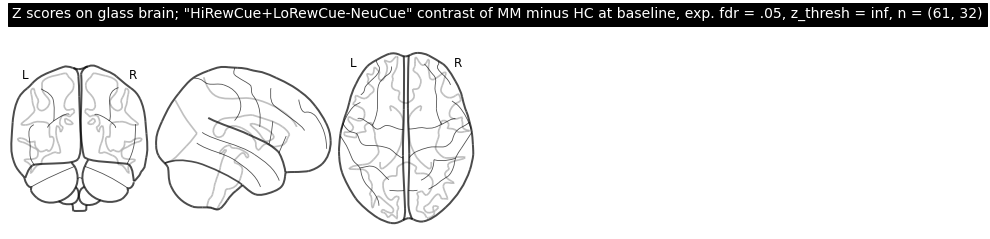

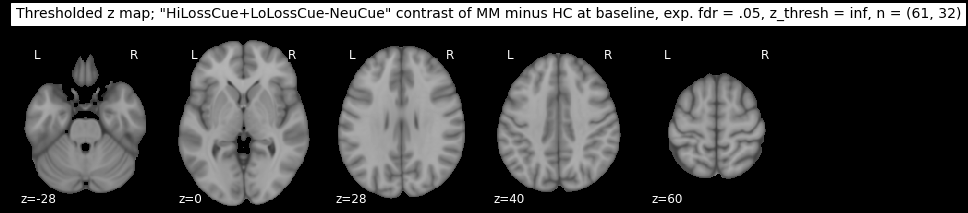

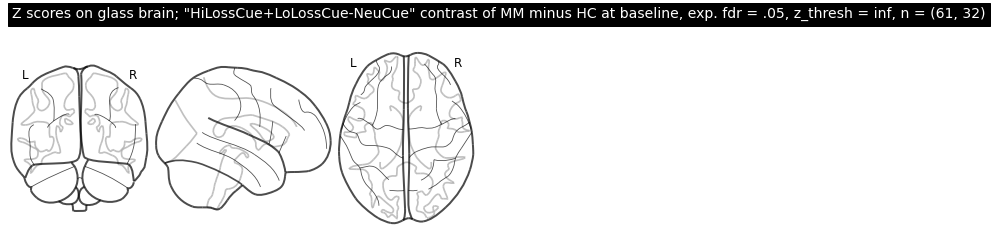

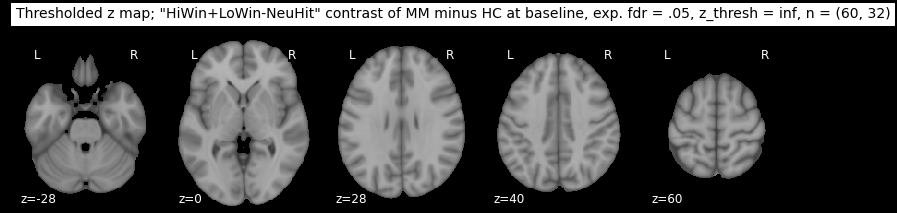

...

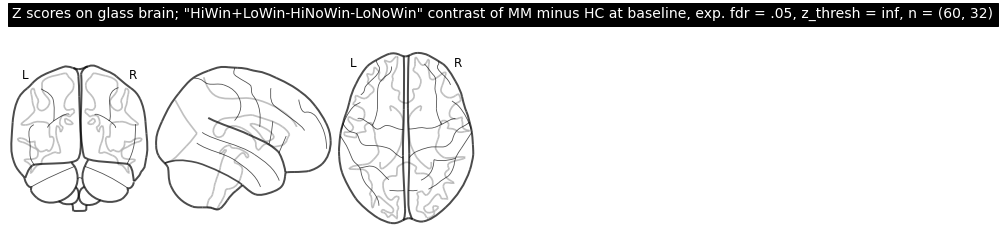

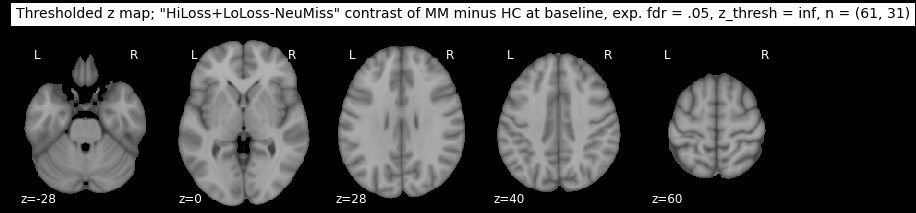

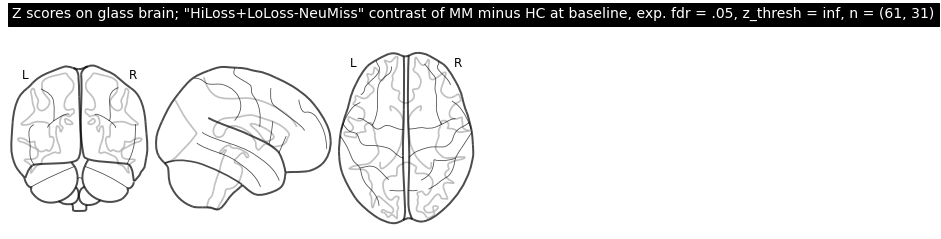

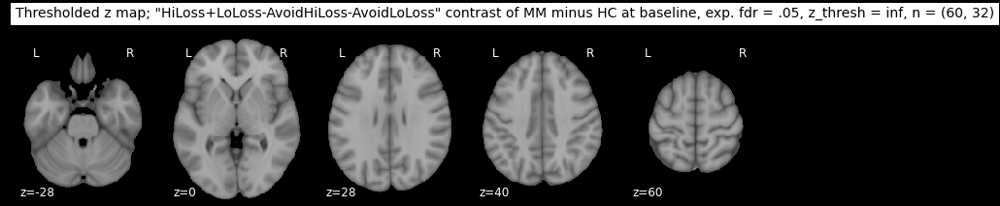

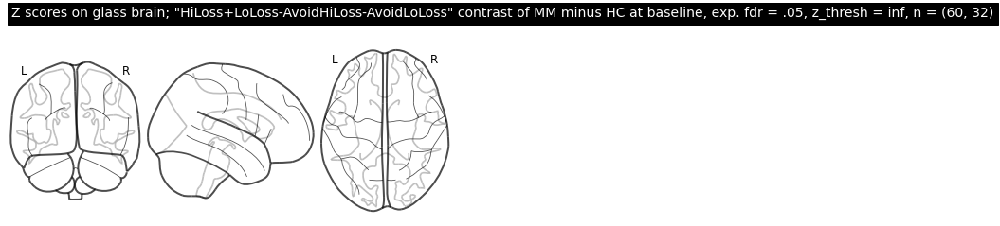

In [52]:
groups=['MM','HC']
ses='baseline'
task='mid'
space='MNI152NLin6Asym' #change if desired
covariates_list = [[],['sex'],['age'],['THC_freq_month'],['total_cudit'],['age','sex'],['THC_freq_month','age','sex'],['total_cudit','age','sex'] ]
MNI_template_used = nibabel.load('./templates/tpl-MNI152NLin6Asym_res-01_desc-brain_T1w.nii.gz')

#combined high/low options include: '
# 'HiRewCue+LoRewCue-NeuCue'(combined reward anticipation)
# 'HiLossCue+LoLossCue-NeuCue' (combined loss anticipation)
# 'HiWin+LoWin-NeuHit' (combined reward outcome cp. to neutral hit)
# 'HiWin+LoWin-HiNoWin-LoNoWin' (combined reward outcome cp. to combined reward miss)
# 'HiLoss+LoLoss-NeuMiss' (combined loss cp. to neutral miss)
# 'HiLoss+LoLoss-AvoidHiLoss-AvoidLoLoss' (combined loss cp. to combined avoid loss)
contrasts=['HiRewCue+LoRewCue-NeuCue','HiLossCue+LoLossCue-NeuCue','HiWin+LoWin-NeuHit','HiWin+LoWin-HiNoWin-LoNoWin','HiLoss+LoLoss-NeuMiss','HiLoss+LoLoss-AvoidHiLoss-AvoidLoLoss']


#TO: loop through all contrasts
for covariates in covariates_list:
    for contrast in contrasts:
        #compute group difference contrast
        contrast_output, mask, part_count = get_baseline_group_difference_contrast(contrast,ses,groups,task,covariates)

        #calculate fdr-thresholded map
        threshold_map, threshold = fdr_threshold_map(contrast_output['z_score'], mask)
        print(covariates)
        #make visualizations
        axial_slices = plot_axial_slices(threshold_map, threshold, MNI_template_used, contrast, 'MM minus HC', ses, part_count)
        glass_brain = plot_glass_brains(threshold_map, threshold, contrast, 'MM minus HC', ses, part_count)

    

In [ ]:
#PAIRED group difference model for MM at 1year vs. baseline

In [53]:
def get_MM_paired_group_difference_contrast(contrast,sessions,group,task,covariates):
    
    #get individual effect size maps by subjects
    effect_size_maps_by_ses = [] #list of two dictionaries, one per ses, both with subjects as keys and their effect size paths as values
    for ses in sessions:
        effect_size_maps, all_subs = get_effect_size_maps(contrast,ses,group,task)
        effect_size_by_subj_dict = {}
        for i in range(len(effect_size_maps)):
            sub = all_subs[i]
            path = effect_size_maps[i]
            effect_size_by_subj_dict[sub] = path
        effect_size_maps_by_ses.append(effect_size_by_subj_dict)

    #find subjects with both baseline and 1year scans
    subjs_with_both_ses = list(set(effect_size_maps_by_ses[0].keys()).intersection(set(effect_size_maps_by_ses[1].keys())))
    part_count = len(subjs_with_both_ses)
    
    #subtract baseline from 1year scans
    #save as list of nii effect size maps
    effect_size_maps=[]
    for sub in subjs_with_both_ses:
        effect_size_map_0 = nibabel.load(effect_size_maps_by_ses[0][sub])
        effect_size_map_1 = nibabel.load(effect_size_maps_by_ses[1][sub])
        diff_img = math_img("img0 - img1", img0=effect_size_map_0, img1=effect_size_map_1)
        effect_size_maps.append(diff_img)

    #rewrite subject names so they match the csv file
    subs = ['_'.join([s for s in re.split(r'(MM|HC)', sub) if s]) for sub in subjs_with_both_ses]
    
    #get design matrix for the group
    #if sex present, will include Male/Female; otherwise will include a column of all 1s called group average
    group_design_matrix = create_group_design_matrix(subs,group,ses,covariates)

    #grab masks needed (all MM, both 1year and baseline) for the included subjects
    masks = []
    for sub in subjs_with_both_ses:
        masks+=glob.glob(f'../../../derivatives/ses-*/sub-{sub}*/ses-*/func/sub-{group}*task-{task}*rec-unco*run-1_*{space}*brain_mask.nii.gz')

    #make intersection of the masks
    #threshold=1 corresponds to keeping the intersection of all masks, whereas threshold=0 is the union of all masks
    mask = intersect_masks(masks, threshold=1, connected=True)
    
    #define group level model
    cache_loc = './nilearn_cache' #change if desired

    second_level_model = SecondLevelModel(mask_img=mask, target_affine=None, target_shape=None, 
                                      smoothing_fwhm=None, memory=cache_loc, memory_level=1, 
                                      verbose=0, n_jobs=-2, minimize_memory=False)
    #fit model
    second_level_model = second_level_model.fit(
        effect_size_maps,
        design_matrix=group_design_matrix,
    )
        
   

    #define contrast matrix to include single column of 1s 
    contrast_matrix = np.eye(group_design_matrix.shape[1])
    contrasts = dict([(column, contrast_matrix[i])
                  for i, column in enumerate(group_design_matrix.columns)])
    
    print(contrasts)
    
    
    
    #here we do a group average difference either just using a column of ones for each group or include the Male/Female columns
    if 'sex' in covariates:
        grp_contrast = 0.5*contrasts['Female']+0.5*contrasts['Male']
    else:
        grp_contrast = contrasts['group_average']
    
    print(grp_contrast)

    contrast_output = second_level_model.compute_contrast(second_level_contrast=grp_contrast, 
                                                      second_level_stat_type=None, output_type='all')
    #for printing the covariates
    if covariates == '':
        covariates = 'nothing'
        
    print('Processing done of MM 1year vs. baseline for: '+' '.join([contrast,task]))
    print(f'Controlled for {covariates}')

    return (contrast_output, mask, part_count)

    

{'group_average': array([1.])}
[1.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 2.28894 , ...,  3.136789],
       ...,
       [-0.2746  , ...,  4.510215]]), 
array([[1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.6s, 0.0min
________________________________________________________________________________
[M

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.362285799789675. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'group_average': array([1.])}
[1.]
________________________________________________________________________________
[Memory] Calling nilearn.maskers.nifti_masker._filter_and_mask...
_filter_and_mask([ <nibabel.nifti1.Nifti1Image object at 0x2ba6ea9eb250>,
  <nibabel.nifti..., 
<nibabel.nifti1.Nifti1Image object at 0x2ba6e1a55850>, { 'detrend': False,
  'dtype': None,
  'high_pass': None,
  'high_variance_confounds': False,
  'low_pass': None,
  'reports': True,
  'runs': None,
  'smoothing_fwhm': None,
  'standardize': False,
  'standardize_confounds': True,
  't_r': None,
  'target_affine': None,
  'target_shape': None}, memory_level=1, memory=Memory(location=./nilearn_cache/joblib), verbose=0, confounds=None, sample_mask=None, copy=True, dtype=None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/maskers/nifti_masker.py:570: UserWarning: Persisting input arguments took 1.16s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  data = self._cache(


__________________________________________________filter_and_mask - 3.3s, 0.1min
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-2.026507, ...,  0.969042],
       ...,
       [ 0.37883 , ...,  3.733236]]), 
array([[1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.4s, 0.0min
______________________________________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.919852847705325. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


________________________________________________________________________________
[Memory] Calling nilearn.image.resampling.resample_img...
resample_img(<nibabel.nifti1.Nifti1Image object at 0x2ba6d1b36c40>, target_affine=None, target_shape=None, copy=False, interpolation='nearest')
_____________________________________________________resample_img - 0.0s, 0.0min
{'group_average': array([1.])}
[1.]
________________________________________________________________________________
[Memory] Calling nilearn.maskers.nifti_masker._filter_and_mask...
_filter_and_mask([ <nibabel.nifti1.Nifti1Image object at 0x2ba6d1b2cca0>,
  <nibabel.nifti..., 
<nibabel.nifti1.Nifti1Image object at 0x2ba6d1b36c40>, { 'detrend': False,
  'dtype': None,
  'high_pass': None,
  'high_variance_confounds': False,
  'low_pass': None,
  'reports': True,
  'runs': None,
  'smoothing_fwhm': None,
  'standardize': False,
  'standardize_confounds': True,
  't_r': None,
  'target_affine': None,
  'target_shape': None}, memor

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/maskers/nifti_masker.py:570: UserWarning: Persisting input arguments took 1.07s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  data = self._cache(


__________________________________________________filter_and_mask - 3.6s, 0.1min
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-1.097569, ..., -1.454474],
       ...,
       [-1.329712, ..., -7.419736]]), 
array([[1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
______________________________________________________________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 5.099005666386977. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


________________________________________________________________________________
[Memory] Calling nilearn.image.resampling.resample_img...
resample_img(<nibabel.nifti1.Nifti1Image object at 0x2ba6d927ddc0>, target_affine=None, target_shape=None, copy=False, interpolation='nearest')
_____________________________________________________resample_img - 0.0s, 0.0min
{'group_average': array([1.])}
[1.]
________________________________________________________________________________
[Memory] Calling nilearn.maskers.nifti_masker._filter_and_mask...
_filter_and_mask([ <nibabel.nifti1.Nifti1Image object at 0x2ba6d925bfa0>,
  <nibabel.nifti..., 
<nibabel.nifti1.Nifti1Image object at 0x2ba6d927ddc0>, { 'detrend': False,
  'dtype': None,
  'high_pass': None,
  'high_variance_confounds': False,
  'low_pass': None,
  'reports': True,
  'runs': None,
  'smoothing_fwhm': None,
  'standardize': False,
  'standardize_confounds': True,
  't_r': None,
  'target_affine': None,
  'target_shape': None}, memor

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/maskers/nifti_masker.py:570: UserWarning: Persisting input arguments took 1.11s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  data = self._cache(


__________________________________________________filter_and_mask - 3.3s, 0.1min
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-0.415369, ...,  0.219618],
       ...,
       [ 0.393683, ..., -1.190202]]), 
array([[1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.2s, 0.0min
__________________________________________________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 3.719708088600681. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'group_average': array([1.])}
[1.]
________________________________________________________________________________
[Memory] Calling nilearn.maskers.nifti_masker._filter_and_mask...
_filter_and_mask([ <nibabel.nifti1.Nifti1Image object at 0x2ba6ea9eed90>,
  <nibabel.nifti..., 
<nibabel.nifti1.Nifti1Image object at 0x2ba6ea9d0d90>, { 'detrend': False,
  'dtype': None,
  'high_pass': None,
  'high_variance_confounds': False,
  'low_pass': None,
  'reports': True,
  'runs': None,
  'smoothing_fwhm': None,
  'standardize': False,
  'standardize_confounds': True,
  't_r': None,
  'target_affine': None,
  'target_shape': None}, memory_level=1, memory=Memory(location=./nilearn_cache/joblib), verbose=0, confounds=None, sample_mask=None, copy=True, dtype=None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/maskers/nifti_masker.py:570: UserWarning: Persisting input arguments took 1.12s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  data = self._cache(


__________________________________________________filter_and_mask - 3.4s, 0.1min
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 1.709   , ..., -4.205097],
       ...,
       [ 1.08906 , ...,  0.763781]]), 
array([[1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 1.3s, 0.0min
______________________________________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.5915200999242245. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'group_average': array([1.])}
[1.]
________________________________________________________________________________
[Memory] Calling nilearn.maskers.nifti_masker._filter_and_mask...
_filter_and_mask([ <nibabel.nifti1.Nifti1Image object at 0x2ba6ea5a65e0>,
  <nibabel.nifti..., 
<nibabel.nifti1.Nifti1Image object at 0x2ba6ea5afa30>, { 'detrend': False,
  'dtype': None,
  'high_pass': None,
  'high_variance_confounds': False,
  'low_pass': None,
  'reports': True,
  'runs': None,
  'smoothing_fwhm': None,
  'standardize': False,
  'standardize_confounds': True,
  't_r': None,
  'target_affine': None,
  'target_shape': None}, memory_level=1, memory=Memory(location=./nilearn_cache/joblib), verbose=0, confounds=None, sample_mask=None, copy=True, dtype=None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/maskers/nifti_masker.py:570: UserWarning: Persisting input arguments took 1.11s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  data = self._cache(


__________________________________________________filter_and_mask - 3.4s, 0.1min
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-1.875097, ..., -2.063661],
       ...,
       [ 1.056144, ...,  2.677252]]), 
array([[1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.8s, 0.0min
__________________________________________________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.2173060867632834. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'Female': array([1., 0.]), 'Male': array([0., 1.])}
[0.5 0.5]
Processing done of MM 1year vs. baseline for: HiRewCue+LoRewCue-NeuCue mid
Controlled for ['sex']


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.483836585500596. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'Female': array([1., 0.]), 'Male': array([0., 1.])}
[0.5 0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-2.026507, ...,  0.969042],
       ...,
       [ 0.37883 , ...,  3.733236]]), 
array([[0, 1],
       ...,
       [1, 0]], dtype=uint8), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6ea7cd9a0>}, array([0.5, 0.5]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 0.107602, ..., -0.687657]), <

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.927188868504368. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'Female': array([1., 0.]), 'Male': array([0., 1.])}
[0.5 0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-1.097569, ..., -1.454474],
       ...,
       [-1.329712, ..., -7.419736]]), 
array([[1, 0],
       ...,
       [1, 0]], dtype=uint8), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6de3e3970>}, array([0.5, 0.5]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([1.807865, ..., 0.790847]), <ni

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.536401787045517. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'Female': array([1., 0.]), 'Male': array([0., 1.])}
[0.5 0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 1.709   , ..., -4.205097],
       ...,
       [ 1.08906 , ...,  0.763781]]), 
array([[1, 0],
       ...,
       [1, 0]], dtype=uint8), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d9bb8460>}, array([0.5, 0.5]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 0.066588, ..., -0.362172]), <

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.840675910133789. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:144: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  figure = plt.figure(figure, figsize=figsize,
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'Female': array([1., 0.]), 'Male': array([0., 1.])}
[0.5 0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-1.875097, ..., -2.063661],
       ...,
       [ 1.056144, ...,  2.677252]]), 
array([[1, 0],
       ...,
       [1, 0]], dtype=uint8), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6e76be280>}, array([0.5, 0.5]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.044594, ..., -1.024676]), <

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.4597955120519925. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'group_average': array([1., 0.]), 'age': array([0., 1.])}
[1. 0.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 2.28894 , ...,  3.136789],
       ...,
       [-0.2746  , ...,  4.510215]]), 
array([[ 1.      ,  2.431818],
       ...,
       [ 1.      , 14.431818]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d4457ee0>}, array([1., 0.]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-1.639217

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.3479425826144835. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'group_average': array([1., 0.]), 'age': array([0., 1.])}
[1. 0.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-2.026507, ...,  0.969042],
       ...,
       [ 0.37883 , ...,  3.733236]]), 
array([[ 1.      ,  2.431818],
       ...,
       [ 1.      , 14.431818]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d578bdf0>}, array([1., 0.]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.507488

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.989782563627182. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'group_average': array([1., 0.]), 'age': array([0., 1.])}
[1. 0.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-1.097569, ..., -1.454474],
       ...,
       [-1.329712, ..., -7.419736]]), 
array([[  1.      , -15.785714],
       ...,
       [  1.      ,  14.214286]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d8e32cd0>}, array([1., 0.]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([1.163

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 3.7190666530415877. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'group_average': array([1., 0.]), 'age': array([0., 1.])}
[1. 0.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 1.709   , ..., -4.205097],
       ...,
       [ 1.08906 , ...,  0.763781]]), 
array([[  1.      , -15.568182],
       ...,
       [  1.      ,  14.431818]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6e3ecd160>}, array([1., 0.]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.730

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.548047318903786. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'group_average': array([1., 0.]), 'age': array([0., 1.])}
[1. 0.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-1.875097, ..., -2.063661],
       ...,
       [ 1.056144, ...,  2.677252]]), 
array([[  1.      , -15.511628],
       ...,
       [  1.      ,  14.488372]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.6s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6de992fa0>}, array([1., 0.]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 0.41

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.190086163298478. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'group_average': array([1., 0.]), 'THC_freq_month': array([0., 1.])}
[1. 0.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 2.28894 , ...,  3.136789],
       ...,
       [-0.2746  , ...,  4.510215]]), 
array([[ 1.      , -1.181818],
       ...,
       [ 1.      , -1.181818]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d6053fa0>}, array([1., 0.]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.32401843075843. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'group_average': array([1., 0.]), 'THC_freq_month': array([0., 1.])}
[1. 0.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-2.026507, ...,  0.969042],
       ...,
       [ 0.37883 , ...,  3.733236]]), 
array([[ 1.      , -1.181818],
       ...,
       [ 1.      , -1.181818]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d24bb8e0>}, array([1., 0.]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.963101962594172. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'group_average': array([1., 0.]), 'THC_freq_month': array([0., 1.])}
[1. 0.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-1.097569, ..., -1.454474],
       ...,
       [-1.329712, ..., -7.419736]]), 
array([[ 1.      ,  0.761905],
       ...,
       [ 1.      , -1.238095]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d18bc070>}, array([1., 0.]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 5.0359396038800455. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'group_average': array([1., 0.]), 'THC_freq_month': array([0., 1.])}
[1. 0.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-0.415369, ...,  0.219618],
       ...,
       [ 0.393683, ..., -1.190202]]), 
array([[ 1.      ,  0.790698],
       ...,
       [ 1.      , -1.209302]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d27541c0>}, array([1., 0.]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 3.726428317487567. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'group_average': array([1., 0.]), 'THC_freq_month': array([0., 1.])}
[1. 0.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 1.709   , ..., -4.205097],
       ...,
       [ 1.08906 , ...,  0.763781]]), 
array([[ 1.      ,  0.818182],
       ...,
       [ 1.      , -1.181818]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d3c57580>}, array([1., 0.]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.54837592240893. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'group_average': array([1., 0.]), 'THC_freq_month': array([0., 1.])}
[1. 0.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-1.875097, ..., -2.063661],
       ...,
       [ 1.056144, ...,  2.677252]]), 
array([[ 1.      ,  0.790698],
       ...,
       [ 1.      , -1.209302]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.6s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d4d2cf70>}, array([1., 0.]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.316334906676009. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'group_average': array([1., 0.]), 'total_cudit': array([0., 1.])}
[1. 0.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 2.28894 , ...,  3.136789],
       ...,
       [-0.2746  , ...,  4.510215]]), 
array([[ 1.      ,  1.568182],
       ...,
       [ 1.      , -3.431818]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.8s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d5645370>}, array([1., 0.]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.361279337448716. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'group_average': array([1., 0.]), 'total_cudit': array([0., 1.])}
[1. 0.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-2.026507, ...,  0.969042],
       ...,
       [ 0.37883 , ...,  3.733236]]), 
array([[ 1.      ,  1.568182],
       ...,
       [ 1.      , -3.431818]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d69378b0>}, array([1., 0.]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.876004325109421. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'group_average': array([1., 0.]), 'total_cudit': array([0., 1.])}
[1. 0.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-1.097569, ..., -1.454474],
       ...,
       [-1.329712, ..., -7.419736]]), 
array([[ 1.      , -0.452381],
       ...,
       [ 1.      , -3.452381]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.6s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d708a790>}, array([1., 0.]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([1

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 5.040377690750199. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'group_average': array([1., 0.]), 'total_cudit': array([0., 1.])}
[1. 0.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-0.415369, ...,  0.219618],
       ...,
       [ 0.393683, ..., -1.190202]]), 
array([[ 1.      , -0.395349],
       ...,
       [ 1.      , -3.395349]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d81f2850>}, array([1., 0.]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 3.8503705673808897. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'group_average': array([1., 0.]), 'total_cudit': array([0., 1.])}
[1. 0.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 1.709   , ..., -4.205097],
       ...,
       [ 1.08906 , ...,  0.763781]]), 
array([[ 1.      , -0.431818],
       ...,
       [ 1.      , -3.431818]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d8b0aa90>}, array([1., 0.]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.547682716081622. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'group_average': array([1., 0.]), 'total_cudit': array([0., 1.])}
[1. 0.]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-1.875097, ..., -2.063661],
       ...,
       [ 1.056144, ...,  2.677252]]), 
array([[ 1.      , -0.395349],
       ...,
       [ 1.      , -3.395349]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.6s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6d9758d60>}, array([1., 0.]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.347422600889809. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'age': array([1., 0., 0.]), 'Female': array([0., 1., 0.]), 'Male': array([0., 0., 1.])}
[0.  0.5 0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 2.28894 , ...,  3.136789],
       ...,
       [-0.2746  , ...,  4.510215]]), 
array([[ 2.431818, ...,  1.      ],
       ...,
       [14.431818, ...,  0.      ]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6daa51310>}, array([0. , 0.5, 0.5]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Call

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.510088537030676. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'age': array([1., 0., 0.]), 'Female': array([0., 1., 0.]), 'Male': array([0., 0., 1.])}
[0.  0.5 0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-2.026507, ...,  0.969042],
       ...,
       [ 0.37883 , ...,  3.733236]]), 
array([[ 2.431818, ...,  1.      ],
       ...,
       [14.431818, ...,  0.      ]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6db5f7430>}, array([0. , 0.5, 0.5]), None)


/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/glm/second_level/second_level.py:515: UserWarning: Persisting input arguments took 0.52s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  contrast = mem_contrast(self.labels_, self.results_, con_val,


_________________________________________________compute_contrast - 0.4s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 0.06125 , ..., -1.023127]), <nibabel.nifti1.Nifti1Image object at 0x2ba6db5f69a0>)
___________________________________________________________unmask - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 0.061626, ..., -1.036058]), <nibabel.nifti1.Nifti1Image object at 0x2ba6db5f69a0>)
___________________________________________________________unmask - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.47558 , ..., 0.846876]), <nibabel.nifti1.Nifti1Image object at 0x2ba6db5f69a0>)
___________________________________________________________unmask - 0.7s, 0.0min
____________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.862054524153601. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'age': array([1., 0., 0.]), 'Female': array([0., 1., 0.]), 'Male': array([0., 0., 1.])}
[0.  0.5 0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-1.097569, ..., -1.454474],
       ...,
       [-1.329712, ..., -7.419736]]), 
array([[-15.785714, ...,   0.      ],
       ...,
       [ 14.214286, ...,   0.      ]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6dbdd54f0>}, array([0. , 0.5, 0.5]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
________________________________________________________________________________
[Memory] 

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.439420036829435. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'age': array([1., 0., 0.]), 'Female': array([0., 1., 0.]), 'Male': array([0., 0., 1.])}
[0.  0.5 0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 1.709   , ..., -4.205097],
       ...,
       [ 1.08906 , ...,  0.763781]]), 
array([[-15.568182, ...,   0.      ],
       ...,
       [ 14.431818, ...,   0.      ]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6dd94ca60>}, array([0. , 0.5, 0.5]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
________________________________________________________________________________
[Memory] 

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.77202832820481. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'age': array([1., 0., 0.]), 'Female': array([0., 1., 0.]), 'Male': array([0., 0., 1.])}
[0.  0.5 0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-1.875097, ..., -2.063661],
       ...,
       [ 1.056144, ...,  2.677252]]), 
array([[-15.511628, ...,   0.      ],
       ...,
       [ 14.488372, ...,   0.      ]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6de619dc0>}, array([0. , 0.5, 0.5]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
________________________________________________________________________________
[Memory] 

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.366476910457007. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'age': array([1., 0., 0., 0.]), 'THC_freq_month': array([0., 1., 0., 0.]), 'Female': array([0., 0., 1., 0.]), 'Male': array([0., 0., 0., 1.])}
[0.  0.  0.5 0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 2.28894 , ...,  3.136789],
       ...,
       [-0.2746  , ...,  4.510215]]), 
array([[ 2.431818, ...,  1.      ],
       ...,
       [14.431818, ...,  0.      ]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6df358610>}, array([0. , 0. , 0.5, 0.5]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
______________________________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.533055648513243. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'age': array([1., 0., 0., 0.]), 'THC_freq_month': array([0., 1., 0., 0.]), 'Female': array([0., 0., 1., 0.]), 'Male': array([0., 0., 0., 1.])}
[0.  0.  0.5 0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-2.026507, ...,  0.969042],
       ...,
       [ 0.37883 , ...,  3.733236]]), 
array([[ 2.431818, ...,  1.      ],
       ...,
       [14.431818, ...,  0.      ]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6e0577340>}, array([0. , 0. , 0.5, 0.5]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
______________________________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.8313936484603826. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'age': array([1., 0., 0., 0.]), 'THC_freq_month': array([0., 1., 0., 0.]), 'Female': array([0., 0., 1., 0.]), 'Male': array([0., 0., 0., 1.])}
[0.  0.  0.5 0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-1.097569, ..., -1.454474],
       ...,
       [-1.329712, ..., -7.419736]]), 
array([[-15.785714, ...,   0.      ],
       ...,
       [ 14.214286, ...,   0.      ]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6e0f54a90>}, array([0. , 0. , 0.5, 0.5]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
__________________________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'age': array([1., 0., 0., 0.]), 'THC_freq_month': array([0., 1., 0., 0.]), 'Female': array([0., 0., 1., 0.]), 'Male': array([0., 0., 0., 1.])}
[0.  0.  0.5 0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-0.415369, ...,  0.219618],
       ...,
       [ 0.393683, ..., -1.190202]]), 
array([[-15.511628, ...,   0.      ],
       ...,
       [ 14.488372, ...,   0.      ]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6e2104340>}, array([0. , 0. , 0.5, 0.5]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
__________________________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.434083753422976. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'age': array([1., 0., 0., 0.]), 'THC_freq_month': array([0., 1., 0., 0.]), 'Female': array([0., 0., 1., 0.]), 'Male': array([0., 0., 0., 1.])}
[0.  0.  0.5 0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 1.709   , ..., -4.205097],
       ...,
       [ 1.08906 , ...,  0.763781]]), 
array([[-15.568182, ...,   0.      ],
       ...,
       [ 14.431818, ...,   0.      ]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6e2915040>}, array([0. , 0. , 0.5, 0.5]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
__________________________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.942636314015593. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'age': array([1., 0., 0., 0.]), 'THC_freq_month': array([0., 1., 0., 0.]), 'Female': array([0., 0., 1., 0.]), 'Male': array([0., 0., 0., 1.])}
[0.  0.  0.5 0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-1.875097, ..., -2.063661],
       ...,
       [ 1.056144, ...,  2.677252]]), 
array([[-15.511628, ...,   0.      ],
       ...,
       [ 14.488372, ...,   0.      ]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.6s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6e393e6d0>}, array([0. , 0. , 0.5, 0.5]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
__________________________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.357244901412196. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'age': array([1., 0., 0., 0.]), 'total_cudit': array([0., 1., 0., 0.]), 'Female': array([0., 0., 1., 0.]), 'Male': array([0., 0., 0., 1.])}
[0.  0.  0.5 0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 2.28894 , ...,  3.136789],
       ...,
       [-0.2746  , ...,  4.510215]]), 
array([[ 2.431818, ...,  1.      ],
       ...,
       [14.431818, ...,  0.      ]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6e429d610>}, array([0. , 0. , 0.5, 0.5]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
_________________________________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.562823236058376. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'age': array([1., 0., 0., 0.]), 'total_cudit': array([0., 1., 0., 0.]), 'Female': array([0., 0., 1., 0.]), 'Male': array([0., 0., 0., 1.])}
[0.  0.  0.5 0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-2.026507, ...,  0.969042],
       ...,
       [ 0.37883 , ...,  3.733236]]), 
array([[ 2.431818, ...,  1.      ],
       ...,
       [14.431818, ...,  0.      ]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6e4f62d60>}, array([0. , 0. , 0.5, 0.5]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
_________________________________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.8017060233933. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'age': array([1., 0., 0., 0.]), 'total_cudit': array([0., 1., 0., 0.]), 'Female': array([0., 0., 1., 0.]), 'Male': array([0., 0., 0., 1.])}
[0.  0.  0.5 0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-1.097569, ..., -1.454474],
       ...,
       [-1.329712, ..., -7.419736]]), 
array([[-15.785714, ...,   0.      ],
       ...,
       [ 14.214286, ...,   0.      ]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6e5c45e80>}, array([0. , 0. , 0.5, 0.5]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
_____________________________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'age': array([1., 0., 0., 0.]), 'total_cudit': array([0., 1., 0., 0.]), 'Female': array([0., 0., 1., 0.]), 'Male': array([0., 0., 0., 1.])}
[0.  0.  0.5 0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-0.415369, ...,  0.219618],
       ...,
       [ 0.393683, ..., -1.190202]]), 
array([[-15.511628, ...,   0.      ],
       ...,
       [ 14.488372, ...,   0.      ]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6e6c3e0d0>}, array([0. , 0. , 0.5, 0.5]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
_____________________________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.394111216945991. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'age': array([1., 0., 0., 0.]), 'total_cudit': array([0., 1., 0., 0.]), 'Female': array([0., 0., 1., 0.]), 'Male': array([0., 0., 0., 1.])}
[0.  0.  0.5 0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[ 1.709   , ..., -4.205097],
       ...,
       [ 1.08906 , ...,  0.763781]]), 
array([[-15.568182, ...,   0.      ],
       ...,
       [ 14.431818, ...,   0.      ]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6e745fbb0>}, array([0. , 0. , 0.5, 0.5]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
_____________________________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.714473144009561. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


{'age': array([1., 0., 0., 0.]), 'total_cudit': array([0., 1., 0., 0.]), 'Female': array([0., 0., 1., 0.]), 'Male': array([0., 0., 0., 1.])}
[0.  0.  0.5 0.5]
________________________________________________________________________________
[Memory] Calling nilearn.glm.first_level.first_level.run_glm...
run_glm(array([[-1.875097, ..., -2.063661],
       ...,
       [ 1.056144, ...,  2.677252]]), 
array([[-15.511628, ...,   0.      ],
       ...,
       [ 14.488372, ...,   0.      ]]), n_jobs=-2, noise_model='ols')
__________________________________________________________run_glm - 0.6s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.glm.contrasts.compute_contrast...
compute_contrast(array([0., ..., 0.]), {0.0: <nilearn.glm.regression.RegressionResults object at 0x2ba6e81dd4c0>}, array([0. , 0. , 0.5, 0.5]), None)
_________________________________________________compute_contrast - 0.4s, 0.0min
_____________________________

/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.4736543911388065. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/om2/user/dclb/.miniconda/envs/nilearn_older_v/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


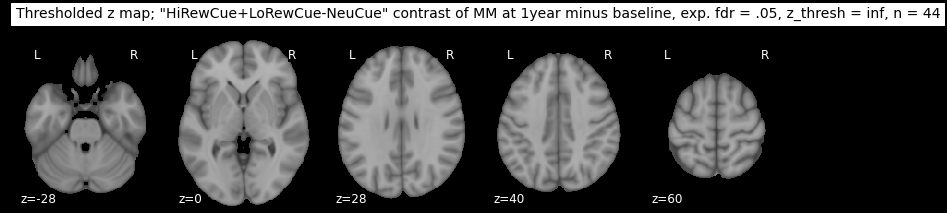

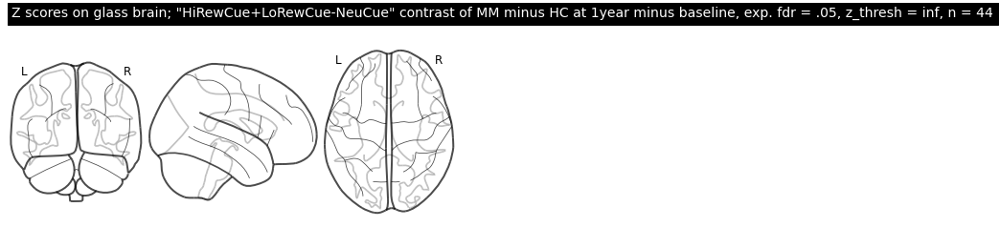

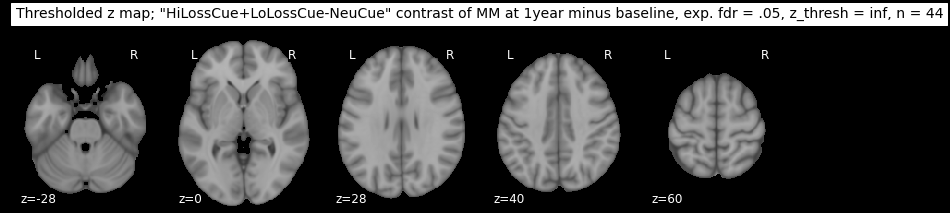

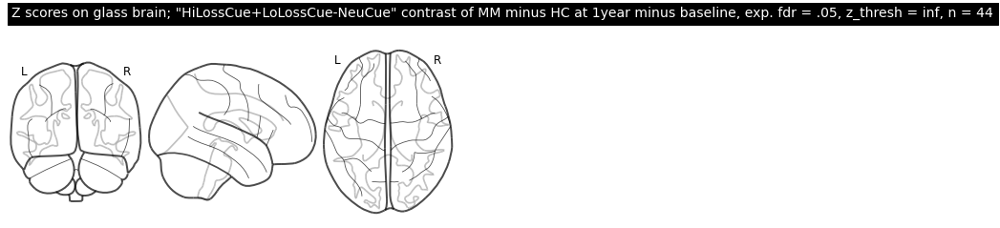

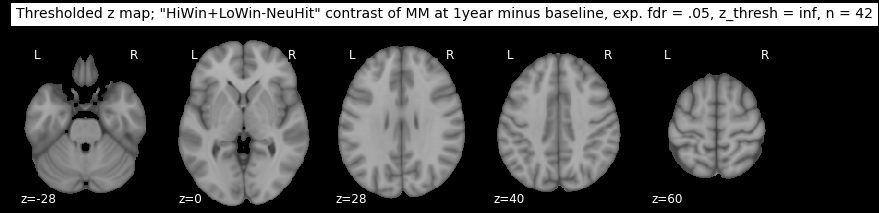

...

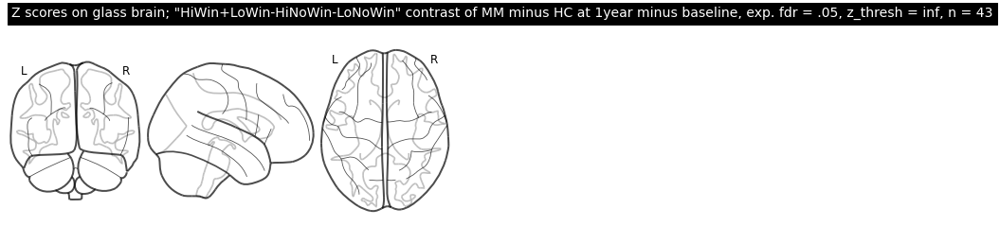

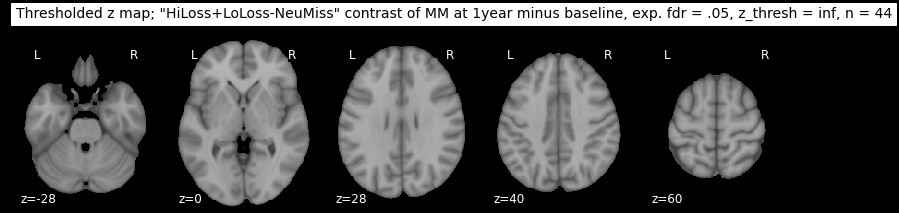

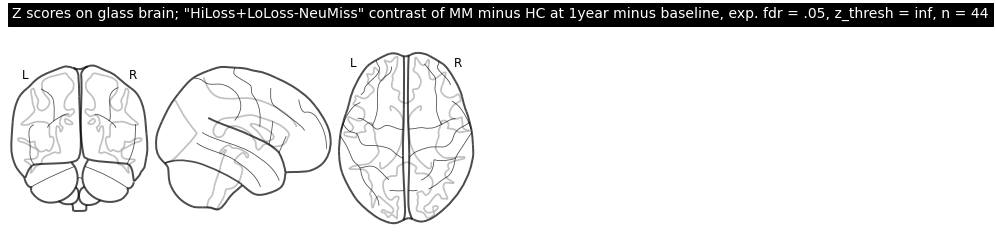

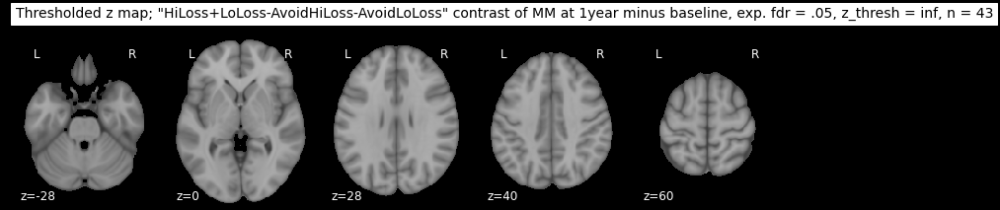

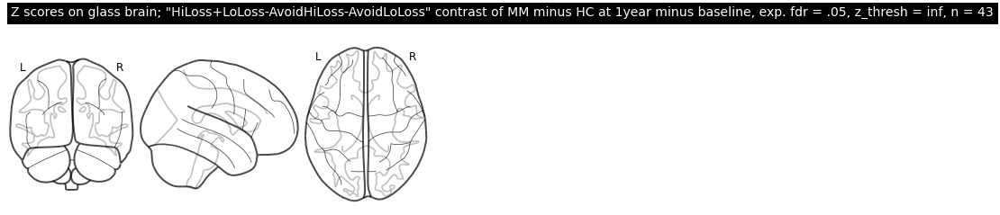

In [55]:
sessions=['1year','baseline']
task='mid'
group='MM'
covariates_list = [[],['sex'],['age'],['THC_freq_month'],['total_cudit'],['age','sex'],['THC_freq_month','age','sex'],['total_cudit','age','sex'] ]
space='MNI152NLin6Asym' #change if desired
MNI_template_used = nibabel.load('./templates/tpl-MNI152NLin6Asym_res-01_desc-brain_T1w.nii.gz')


#combined high/low options include: '
# 'HiRewCue+LoRewCue-NeuCue'(combined reward anticipation)
# 'HiLossCue+LoLossCue-NeuCue' (combined loss anticipation)
# 'HiWin+LoWin-NeuHit' (combined reward outcome cp. to neutral hit)
# 'HiWin+LoWin-HiNoWin-LoNoWin' (combined reward outcome cp. to combined reward miss)
# 'HiLoss+LoLoss-NeuMiss' (combined loss cp. to neutral miss)
# 'HiLoss+LoLoss-AvoidHiLoss-AvoidLoLoss' (combined loss cp. to combined avoid loss)

contrasts=['HiRewCue+LoRewCue-NeuCue','HiLossCue+LoLossCue-NeuCue','HiWin+LoWin-NeuHit','HiWin+LoWin-HiNoWin-LoNoWin','HiLoss+LoLoss-NeuMiss','HiLoss+LoLoss-AvoidHiLoss-AvoidLoLoss']



for covariates in covariates_list:
    for contrast in contrasts:
        contrast_output, mask, part_count = get_MM_paired_group_difference_contrast(contrast,sessions,group,task,covariates)

        #calculate fdr-thresholded map
        threshold_map, threshold = fdr_threshold_map(contrast_output['z_score'], mask)

        #make visualizations
        axial_slices = plot_axial_slices(threshold_map, threshold, MNI_template_used, contrast, group, '1year minus baseline', part_count)
        glass_brain = plot_glass_brains(threshold_map, threshold, contrast, 'MM minus HC', '1year minus baseline', part_count)

    